In [1]:
from sklearn.datasets import load_files       
from keras.utils import np_utils
import numpy as np
from glob import glob

# define function to load train, test, and validation datasets
def load_dataset(path):
    data = load_files(path)
    files = np.array(data['filenames'])
    targets = np_utils.to_categorical(np.array(data['target']), 3)
    return files, targets

# load train, test, and validation datasets
train_files, train_targets = load_dataset('data/train')
valid_files, valid_targets = load_dataset('data/valid')
test_files, test_targets = load_dataset('data/test')

# load ordered list of dog names
anomaly_type = [item[:-1] for item in glob('data/train/*/')]

# print statistics about the dataset
print('There are %d total anomaly categories.' % len(anomaly_type))
print('There are %s total anomaly images.\n' % str(len(train_files) + len(valid_files) + len(test_files)))
print('There are %d training anomaly images.' % len(train_files))
print('There are %d validation anomaly images.' % len(valid_files))
print('There are %d test anomaly images.'% len(test_files))

Using TensorFlow backend.


There are 3 total anomaly categories.
There are 2750 total anomaly images.

There are 2000 training anomaly images.
There are 150 validation anomaly images.
There are 600 test anomaly images.


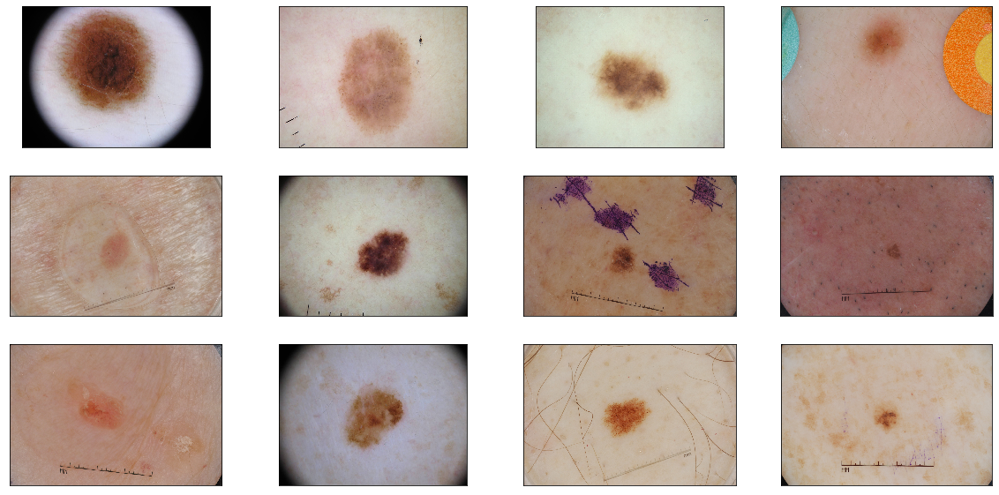

In [69]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

def visualize_img(img_path, ax):
    img = cv2.imread(img_path)
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
fig = plt.figure(figsize=(20, 10))
for i in range(12):
    ax = fig.add_subplot(3, 4, i + 1, xticks=[], yticks=[])
    visualize_img(train_files[i], ax)

In [2]:
from keras.preprocessing import image                  
from tqdm import tqdm

def path_to_tensor(img_path):
    # loads RGB image as PIL.Image.Image type
    img = image.load_img(img_path, target_size=(224, 224))
    # convert PIL.Image.Image type to 3D tensor with shape (224, 224, 3)
    x = image.img_to_array(img)
    # convert 3D tensor to 4D tensor with shape (1, 224, 224, 3) and return 4D tensor
    return np.expand_dims(x, axis=0)

def paths_to_tensor(img_paths):
    list_of_tensors = [path_to_tensor(img_path) for img_path in tqdm(img_paths)]
    return np.vstack(list_of_tensors)

In [3]:
train_tensors = paths_to_tensor(train_files).astype('float32')/255
valid_tensors = paths_to_tensor(valid_files).astype('float32')/255
test_tensors = paths_to_tensor(test_files).astype('float32')/255

100%|████████████████████████████████████████████████████████████████████████████████| 600/600 [02:54<00:00,  3.45it/s]


In [31]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, AveragePooling2D

In [42]:
model = Sequential()

### TODO: Define your architecture.
model.add(Conv2D(filters=16, kernel_size=2, padding='same', activation='relu', input_shape=train_tensors.shape[1:]))
model.add(AveragePooling2D(pool_size=2))
model.add(Conv2D(filters=32, kernel_size=2, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Conv2D(filters=64, kernel_size=2, padding='same', activation='relu'))
model.add(AveragePooling2D(pool_size=2))
model.add(Conv2D(filters=128, kernel_size=2, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))
model.add(Flatten())
model.add(Dense(384, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(3, activation='softmax'))

model.summary()

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_36 (Conv2D)           (None, 224, 224, 16)      208       
_________________________________________________________________
average_pooling2d_6 (Average (None, 112, 112, 16)      0         
_________________________________________________________________
conv2d_37 (Conv2D)           (None, 112, 112, 32)      2080      
_________________________________________________________________
max_pooling2d_29 (MaxPooling (None, 56, 56, 32)        0         
_________________________________________________________________
conv2d_38 (Conv2D)           (None, 56, 56, 64)        8256      
_________________________________________________________________
average_pooling2d_7 (Average (None, 28, 28, 64)        0         
_________________________________________________________________
conv2d_39 (Conv2D)           (None, 28, 28, 128)     

In [112]:
from keras.preprocessing.image import ImageDataGenerator

# create and configure augmented image generator
datagen_train = ImageDataGenerator(
    width_shift_range=0.1,  # randomly shift images horizontally (10% of total width)
    height_shift_range=0.1,  # randomly shift images vertically (10% of total height)
    horizontal_flip=True) # randomly flip images horizontally

# fit augmented image generator on data
datagen_train.fit(train_tensors)

In [43]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [116]:
from keras.callbacks import ModelCheckpoint  

checkpointer = ModelCheckpoint(filepath='saved_models/weights.hdf5', 
                               verbose=1, save_best_only=True)

model.fit(datagen_train.flow(train_tensors, train_targets),
          validation_data=(valid_tensors, valid_targets),
          epochs=30, callbacks=[checkpointer], verbose=1)

Epoch 1/30
63/63 [==============================] - ETA: 15s - loss: 0.3507 - accuracy: 0.937 - ETA: 14s - loss: 0.4347 - accuracy: 0.875 - ETA: 13s - loss: 0.5389 - accuracy: 0.812 - ETA: 13s - loss: 0.5712 - accuracy: 0.789 - ETA: 13s - loss: 0.5431 - accuracy: 0.800 - ETA: 13s - loss: 0.5935 - accuracy: 0.776 - ETA: 12s - loss: 0.6038 - accuracy: 0.758 - ETA: 12s - loss: 0.6141 - accuracy: 0.746 - ETA: 12s - loss: 0.6190 - accuracy: 0.732 - ETA: 12s - loss: 0.6231 - accuracy: 0.734 - ETA: 11s - loss: 0.6486 - accuracy: 0.727 - ETA: 11s - loss: 0.6678 - accuracy: 0.718 - ETA: 11s - loss: 0.6830 - accuracy: 0.721 - ETA: 11s - loss: 0.6805 - accuracy: 0.723 - ETA: 10s - loss: 0.6794 - accuracy: 0.725 - ETA: 10s - loss: 0.6762 - accuracy: 0.720 - ETA: 10s - loss: 0.6839 - accuracy: 0.715 - ETA: 10s - loss: 0.6830 - accuracy: 0.715 - ETA: 9s - loss: 0.6728 - accuracy: 0.718 - ETA: 9s - loss: 0.6811 - accuracy: 0.72 - ETA: 9s - loss: 0.6835 - accuracy: 0.72 - ETA: 9s - loss: 0.6885 - accu

63/63 [==============================] - ETA: 13s - loss: 0.7516 - accuracy: 0.656 - ETA: 13s - loss: 0.7266 - accuracy: 0.687 - ETA: 13s - loss: 0.7350 - accuracy: 0.677 - ETA: 13s - loss: 0.7703 - accuracy: 0.671 - ETA: 12s - loss: 0.7025 - accuracy: 0.718 - ETA: 12s - loss: 0.6791 - accuracy: 0.724 - ETA: 12s - loss: 0.6683 - accuracy: 0.727 - ETA: 12s - loss: 0.6557 - accuracy: 0.726 - ETA: 12s - loss: 0.6645 - accuracy: 0.722 - ETA: 11s - loss: 0.6687 - accuracy: 0.715 - ETA: 11s - loss: 0.6731 - accuracy: 0.710 - ETA: 11s - loss: 0.6614 - accuracy: 0.716 - ETA: 11s - loss: 0.6875 - accuracy: 0.706 - ETA: 10s - loss: 0.7003 - accuracy: 0.698 - ETA: 10s - loss: 0.6925 - accuracy: 0.700 - ETA: 10s - loss: 0.6774 - accuracy: 0.710 - ETA: 10s - loss: 0.6736 - accuracy: 0.713 - ETA: 9s - loss: 0.6661 - accuracy: 0.716 - ETA: 9s - loss: 0.6627 - accuracy: 0.71 - ETA: 9s - loss: 0.6602 - accuracy: 0.72 - ETA: 9s - loss: 0.6555 - accuracy: 0.72 - ETA: 8s - loss: 0.6568 - accuracy: 0.72 - 

63/63 [==============================] - ETA: 14s - loss: 0.7542 - accuracy: 0.656 - ETA: 13s - loss: 0.8011 - accuracy: 0.640 - ETA: 13s - loss: 0.7786 - accuracy: 0.656 - ETA: 13s - loss: 0.7630 - accuracy: 0.648 - ETA: 13s - loss: 0.7716 - accuracy: 0.637 - ETA: 12s - loss: 0.7171 - accuracy: 0.677 - ETA: 12s - loss: 0.6886 - accuracy: 0.700 - ETA: 12s - loss: 0.6845 - accuracy: 0.707 - ETA: 12s - loss: 0.6884 - accuracy: 0.697 - ETA: 11s - loss: 0.6706 - accuracy: 0.715 - ETA: 11s - loss: 0.6729 - accuracy: 0.710 - ETA: 11s - loss: 0.6848 - accuracy: 0.708 - ETA: 11s - loss: 0.6913 - accuracy: 0.704 - ETA: 10s - loss: 0.7067 - accuracy: 0.694 - ETA: 10s - loss: 0.6999 - accuracy: 0.702 - ETA: 10s - loss: 0.7116 - accuracy: 0.693 - ETA: 10s - loss: 0.7147 - accuracy: 0.691 - ETA: 9s - loss: 0.7080 - accuracy: 0.698 - ETA: 9s - loss: 0.6959 - accuracy: 0.70 - ETA: 9s - loss: 0.6918 - accuracy: 0.70 - ETA: 9s - loss: 0.6907 - accuracy: 0.71 - ETA: 9s - loss: 0.6964 - accuracy: 0.70 - 

63/63 [==============================] - ETA: 13s - loss: 0.6018 - accuracy: 0.750 - ETA: 13s - loss: 0.6193 - accuracy: 0.734 - ETA: 13s - loss: 0.6548 - accuracy: 0.718 - ETA: 13s - loss: 0.7350 - accuracy: 0.679 - ETA: 12s - loss: 0.7190 - accuracy: 0.681 - ETA: 12s - loss: 0.6990 - accuracy: 0.692 - ETA: 12s - loss: 0.6913 - accuracy: 0.692 - ETA: 12s - loss: 0.6745 - accuracy: 0.714 - ETA: 12s - loss: 0.6763 - accuracy: 0.711 - ETA: 11s - loss: 0.6666 - accuracy: 0.718 - ETA: 11s - loss: 0.6734 - accuracy: 0.713 - ETA: 11s - loss: 0.6728 - accuracy: 0.713 - ETA: 11s - loss: 0.6725 - accuracy: 0.713 - ETA: 10s - loss: 0.6664 - accuracy: 0.721 - ETA: 10s - loss: 0.6732 - accuracy: 0.718 - ETA: 10s - loss: 0.6708 - accuracy: 0.716 - ETA: 10s - loss: 0.6681 - accuracy: 0.720 - ETA: 10s - loss: 0.6753 - accuracy: 0.718 - ETA: 9s - loss: 0.6761 - accuracy: 0.720 - ETA: 9s - loss: 0.6788 - accuracy: 0.71 - ETA: 9s - loss: 0.6762 - accuracy: 0.71 - ETA: 9s - loss: 0.6804 - accuracy: 0.71 

63/63 [==============================] - ETA: 13s - loss: 0.6785 - accuracy: 0.687 - ETA: 13s - loss: 0.7818 - accuracy: 0.640 - ETA: 13s - loss: 0.7456 - accuracy: 0.645 - ETA: 13s - loss: 0.7233 - accuracy: 0.648 - ETA: 12s - loss: 0.6941 - accuracy: 0.675 - ETA: 12s - loss: 0.6935 - accuracy: 0.661 - ETA: 12s - loss: 0.6865 - accuracy: 0.665 - ETA: 12s - loss: 0.6723 - accuracy: 0.679 - ETA: 12s - loss: 0.6614 - accuracy: 0.691 - ETA: 11s - loss: 0.6696 - accuracy: 0.687 - ETA: 11s - loss: 0.6672 - accuracy: 0.693 - ETA: 11s - loss: 0.6676 - accuracy: 0.697 - ETA: 11s - loss: 0.6518 - accuracy: 0.709 - ETA: 11s - loss: 0.6450 - accuracy: 0.709 - ETA: 10s - loss: 0.6428 - accuracy: 0.714 - ETA: 10s - loss: 0.6422 - accuracy: 0.712 - ETA: 10s - loss: 0.6445 - accuracy: 0.709 - ETA: 10s - loss: 0.6542 - accuracy: 0.703 - ETA: 9s - loss: 0.6543 - accuracy: 0.703 - ETA: 9s - loss: 0.6431 - accuracy: 0.70 - ETA: 9s - loss: 0.6337 - accuracy: 0.71 - ETA: 9s - loss: 0.6464 - accuracy: 0.71 

63/63 [==============================] - ETA: 13s - loss: 0.4684 - accuracy: 0.812 - ETA: 13s - loss: 0.6157 - accuracy: 0.718 - ETA: 13s - loss: 0.6125 - accuracy: 0.718 - ETA: 13s - loss: 0.5668 - accuracy: 0.750 - ETA: 13s - loss: 0.5728 - accuracy: 0.750 - ETA: 12s - loss: 0.5918 - accuracy: 0.750 - ETA: 12s - loss: 0.6066 - accuracy: 0.736 - ETA: 12s - loss: 0.6268 - accuracy: 0.734 - ETA: 12s - loss: 0.6335 - accuracy: 0.725 - ETA: 11s - loss: 0.6358 - accuracy: 0.731 - ETA: 11s - loss: 0.6515 - accuracy: 0.724 - ETA: 11s - loss: 0.6436 - accuracy: 0.731 - ETA: 11s - loss: 0.6366 - accuracy: 0.728 - ETA: 11s - loss: 0.6396 - accuracy: 0.723 - ETA: 10s - loss: 0.6363 - accuracy: 0.722 - ETA: 10s - loss: 0.6600 - accuracy: 0.709 - ETA: 10s - loss: 0.6682 - accuracy: 0.704 - ETA: 10s - loss: 0.6604 - accuracy: 0.713 - ETA: 9s - loss: 0.6571 - accuracy: 0.715 - ETA: 9s - loss: 0.6550 - accuracy: 0.71 - ETA: 9s - loss: 0.6622 - accuracy: 0.70 - ETA: 9s - loss: 0.6716 - accuracy: 0.70 

63/63 [==============================] - ETA: 12s - loss: 0.7378 - accuracy: 0.718 - ETA: 13s - loss: 0.6549 - accuracy: 0.718 - ETA: 13s - loss: 0.7920 - accuracy: 0.677 - ETA: 12s - loss: 0.7536 - accuracy: 0.687 - ETA: 12s - loss: 0.7095 - accuracy: 0.700 - ETA: 12s - loss: 0.7570 - accuracy: 0.661 - ETA: 12s - loss: 0.7036 - accuracy: 0.687 - ETA: 12s - loss: 0.6874 - accuracy: 0.691 - ETA: 12s - loss: 0.6846 - accuracy: 0.694 - ETA: 11s - loss: 0.6681 - accuracy: 0.700 - ETA: 11s - loss: 0.6739 - accuracy: 0.693 - ETA: 11s - loss: 0.6684 - accuracy: 0.695 - ETA: 11s - loss: 0.6708 - accuracy: 0.689 - ETA: 10s - loss: 0.6941 - accuracy: 0.683 - ETA: 10s - loss: 0.6813 - accuracy: 0.689 - ETA: 10s - loss: 0.6725 - accuracy: 0.697 - ETA: 10s - loss: 0.6579 - accuracy: 0.705 - ETA: 10s - loss: 0.6608 - accuracy: 0.704 - ETA: 9s - loss: 0.6552 - accuracy: 0.707 - ETA: 9s - loss: 0.6506 - accuracy: 0.70 - ETA: 9s - loss: 0.6473 - accuracy: 0.70 - ETA: 9s - loss: 0.6454 - accuracy: 0.70 

63/63 [==============================] - ETA: 12s - loss: 0.5090 - accuracy: 0.718 - ETA: 12s - loss: 0.5791 - accuracy: 0.718 - ETA: 12s - loss: 0.6749 - accuracy: 0.677 - ETA: 12s - loss: 0.6447 - accuracy: 0.695 - ETA: 12s - loss: 0.6135 - accuracy: 0.718 - ETA: 12s - loss: 0.6314 - accuracy: 0.708 - ETA: 12s - loss: 0.6255 - accuracy: 0.718 - ETA: 12s - loss: 0.6051 - accuracy: 0.722 - ETA: 11s - loss: 0.6052 - accuracy: 0.722 - ETA: 11s - loss: 0.5909 - accuracy: 0.734 - ETA: 11s - loss: 0.5995 - accuracy: 0.735 - ETA: 11s - loss: 0.6115 - accuracy: 0.726 - ETA: 11s - loss: 0.6147 - accuracy: 0.721 - ETA: 10s - loss: 0.6124 - accuracy: 0.723 - ETA: 10s - loss: 0.6036 - accuracy: 0.729 - ETA: 10s - loss: 0.5965 - accuracy: 0.734 - ETA: 10s - loss: 0.5917 - accuracy: 0.735 - ETA: 10s - loss: 0.5769 - accuracy: 0.744 - ETA: 9s - loss: 0.5702 - accuracy: 0.750 - ETA: 9s - loss: 0.5829 - accuracy: 0.74 - ETA: 9s - loss: 0.5974 - accuracy: 0.73 - ETA: 9s - loss: 0.6161 - accuracy: 0.72 

63/63 [==============================] - ETA: 12s - loss: 0.6114 - accuracy: 0.750 - ETA: 12s - loss: 0.6676 - accuracy: 0.703 - ETA: 13s - loss: 0.6352 - accuracy: 0.739 - ETA: 12s - loss: 0.6058 - accuracy: 0.757 - ETA: 12s - loss: 0.6034 - accuracy: 0.737 - ETA: 12s - loss: 0.6216 - accuracy: 0.718 - ETA: 12s - loss: 0.6056 - accuracy: 0.727 - ETA: 12s - loss: 0.6190 - accuracy: 0.722 - ETA: 12s - loss: 0.6150 - accuracy: 0.725 - ETA: 11s - loss: 0.6356 - accuracy: 0.715 - ETA: 11s - loss: 0.6389 - accuracy: 0.721 - ETA: 11s - loss: 0.6492 - accuracy: 0.713 - ETA: 11s - loss: 0.6457 - accuracy: 0.713 - ETA: 10s - loss: 0.6387 - accuracy: 0.716 - ETA: 10s - loss: 0.6384 - accuracy: 0.714 - ETA: 10s - loss: 0.6351 - accuracy: 0.716 - ETA: 10s - loss: 0.6282 - accuracy: 0.718 - ETA: 10s - loss: 0.6167 - accuracy: 0.724 - ETA: 9s - loss: 0.6131 - accuracy: 0.722 - ETA: 9s - loss: 0.6126 - accuracy: 0.72 - ETA: 9s - loss: 0.6181 - accuracy: 0.71 - ETA: 9s - loss: 0.6137 - accuracy: 0.71 

63/63 [==============================] - ETA: 12s - loss: 0.5244 - accuracy: 0.781 - ETA: 13s - loss: 0.8092 - accuracy: 0.687 - ETA: 13s - loss: 0.7063 - accuracy: 0.739 - ETA: 13s - loss: 0.6861 - accuracy: 0.750 - ETA: 12s - loss: 0.6664 - accuracy: 0.743 - ETA: 12s - loss: 0.6758 - accuracy: 0.755 - ETA: 12s - loss: 0.6878 - accuracy: 0.741 - ETA: 12s - loss: 0.6942 - accuracy: 0.722 - ETA: 12s - loss: 0.6866 - accuracy: 0.732 - ETA: 11s - loss: 0.6825 - accuracy: 0.725 - ETA: 11s - loss: 0.6753 - accuracy: 0.724 - ETA: 11s - loss: 0.6618 - accuracy: 0.734 - ETA: 11s - loss: 0.6633 - accuracy: 0.738 - ETA: 11s - loss: 0.6646 - accuracy: 0.729 - ETA: 10s - loss: 0.6672 - accuracy: 0.725 - ETA: 10s - loss: 0.6588 - accuracy: 0.728 - ETA: 10s - loss: 0.6546 - accuracy: 0.735 - ETA: 10s - loss: 0.6590 - accuracy: 0.732 - ETA: 9s - loss: 0.6541 - accuracy: 0.733 - ETA: 9s - loss: 0.6465 - accuracy: 0.73 - ETA: 9s - loss: 0.6537 - accuracy: 0.73 - ETA: 9s - loss: 0.6555 - accuracy: 0.73 

63/63 [==============================] - ETA: 13s - loss: 0.6711 - accuracy: 0.718 - ETA: 13s - loss: 0.6141 - accuracy: 0.734 - ETA: 13s - loss: 0.6004 - accuracy: 0.729 - ETA: 13s - loss: 0.6130 - accuracy: 0.703 - ETA: 12s - loss: 0.5839 - accuracy: 0.731 - ETA: 12s - loss: 0.5790 - accuracy: 0.729 - ETA: 12s - loss: 0.6012 - accuracy: 0.723 - ETA: 12s - loss: 0.6271 - accuracy: 0.714 - ETA: 12s - loss: 0.6230 - accuracy: 0.725 - ETA: 11s - loss: 0.6018 - accuracy: 0.737 - ETA: 11s - loss: 0.5867 - accuracy: 0.741 - ETA: 11s - loss: 0.6010 - accuracy: 0.737 - ETA: 11s - loss: 0.5906 - accuracy: 0.738 - ETA: 10s - loss: 0.6026 - accuracy: 0.729 - ETA: 10s - loss: 0.6185 - accuracy: 0.720 - ETA: 10s - loss: 0.6193 - accuracy: 0.720 - ETA: 10s - loss: 0.6139 - accuracy: 0.724 - ETA: 10s - loss: 0.6139 - accuracy: 0.722 - ETA: 9s - loss: 0.6125 - accuracy: 0.728 - ETA: 9s - loss: 0.6088 - accuracy: 0.73 - ETA: 9s - loss: 0.6061 - accuracy: 0.73 - ETA: 9s - loss: 0.6020 - accuracy: 0.74 

63/63 [==============================] - ETA: 13s - loss: 0.4685 - accuracy: 0.781 - ETA: 13s - loss: 0.5193 - accuracy: 0.734 - ETA: 13s - loss: 0.5443 - accuracy: 0.729 - ETA: 13s - loss: 0.5813 - accuracy: 0.703 - ETA: 12s - loss: 0.5630 - accuracy: 0.718 - ETA: 12s - loss: 0.5335 - accuracy: 0.760 - ETA: 12s - loss: 0.5650 - accuracy: 0.732 - ETA: 12s - loss: 0.5897 - accuracy: 0.722 - ETA: 12s - loss: 0.5758 - accuracy: 0.732 - ETA: 11s - loss: 0.5736 - accuracy: 0.734 - ETA: 11s - loss: 0.5819 - accuracy: 0.730 - ETA: 11s - loss: 0.5933 - accuracy: 0.724 - ETA: 11s - loss: 0.5881 - accuracy: 0.723 - ETA: 10s - loss: 0.5804 - accuracy: 0.732 - ETA: 10s - loss: 0.5798 - accuracy: 0.733 - ETA: 10s - loss: 0.5680 - accuracy: 0.744 - ETA: 10s - loss: 0.5764 - accuracy: 0.739 - ETA: 10s - loss: 0.5676 - accuracy: 0.741 - ETA: 9s - loss: 0.5792 - accuracy: 0.738 - ETA: 9s - loss: 0.5967 - accuracy: 0.73 - ETA: 9s - loss: 0.5859 - accuracy: 0.73 - ETA: 9s - loss: 0.5813 - accuracy: 0.73 

63/63 [==============================] - ETA: 12s - loss: 0.5523 - accuracy: 0.843 - ETA: 13s - loss: 0.5331 - accuracy: 0.812 - ETA: 13s - loss: 0.5260 - accuracy: 0.812 - ETA: 13s - loss: 0.5526 - accuracy: 0.781 - ETA: 12s - loss: 0.5402 - accuracy: 0.768 - ETA: 12s - loss: 0.5447 - accuracy: 0.765 - ETA: 12s - loss: 0.5476 - accuracy: 0.758 - ETA: 12s - loss: 0.5841 - accuracy: 0.722 - ETA: 12s - loss: 0.5714 - accuracy: 0.732 - ETA: 11s - loss: 0.5711 - accuracy: 0.731 - ETA: 11s - loss: 0.5910 - accuracy: 0.724 - ETA: 10s - loss: 0.5812 - accuracy: 0.731 - ETA: 10s - loss: 0.5879 - accuracy: 0.722 - ETA: 10s - loss: 0.5815 - accuracy: 0.724 - ETA: 10s - loss: 0.5815 - accuracy: 0.722 - ETA: 10s - loss: 0.5897 - accuracy: 0.715 - ETA: 10s - loss: 0.6046 - accuracy: 0.710 - ETA: 9s - loss: 0.6061 - accuracy: 0.716 - ETA: 9s - loss: 0.6033 - accuracy: 0.72 - ETA: 9s - loss: 0.6035 - accuracy: 0.72 - ETA: 9s - loss: 0.6011 - accuracy: 0.72 - ETA: 9s - loss: 0.5992 - accuracy: 0.72 - 

63/63 [==============================] - ETA: 12s - loss: 0.6498 - accuracy: 0.718 - ETA: 13s - loss: 0.5878 - accuracy: 0.734 - ETA: 13s - loss: 0.6480 - accuracy: 0.708 - ETA: 12s - loss: 0.5890 - accuracy: 0.742 - ETA: 12s - loss: 0.5824 - accuracy: 0.737 - ETA: 12s - loss: 0.5528 - accuracy: 0.750 - ETA: 12s - loss: 0.5626 - accuracy: 0.741 - ETA: 12s - loss: 0.5558 - accuracy: 0.746 - ETA: 11s - loss: 0.5566 - accuracy: 0.739 - ETA: 11s - loss: 0.5620 - accuracy: 0.734 - ETA: 11s - loss: 0.5765 - accuracy: 0.730 - ETA: 11s - loss: 0.5733 - accuracy: 0.729 - ETA: 11s - loss: 0.5894 - accuracy: 0.716 - ETA: 10s - loss: 0.5859 - accuracy: 0.721 - ETA: 10s - loss: 0.5860 - accuracy: 0.727 - ETA: 10s - loss: 0.5718 - accuracy: 0.734 - ETA: 10s - loss: 0.5716 - accuracy: 0.733 - ETA: 10s - loss: 0.5704 - accuracy: 0.732 - ETA: 9s - loss: 0.5722 - accuracy: 0.728 - ETA: 9s - loss: 0.5829 - accuracy: 0.72 - ETA: 9s - loss: 0.5886 - accuracy: 0.72 - ETA: 9s - loss: 0.5780 - accuracy: 0.73 

63/63 [==============================] - ETA: 12s - loss: 0.6367 - accuracy: 0.750 - ETA: 13s - loss: 0.7273 - accuracy: 0.687 - ETA: 13s - loss: 0.6754 - accuracy: 0.708 - ETA: 13s - loss: 0.6698 - accuracy: 0.734 - ETA: 12s - loss: 0.6173 - accuracy: 0.768 - ETA: 12s - loss: 0.6182 - accuracy: 0.755 - ETA: 12s - loss: 0.6182 - accuracy: 0.741 - ETA: 12s - loss: 0.5925 - accuracy: 0.750 - ETA: 12s - loss: 0.6170 - accuracy: 0.732 - ETA: 11s - loss: 0.6171 - accuracy: 0.721 - ETA: 11s - loss: 0.5998 - accuracy: 0.735 - ETA: 11s - loss: 0.5986 - accuracy: 0.744 - ETA: 11s - loss: 0.6007 - accuracy: 0.750 - ETA: 11s - loss: 0.6095 - accuracy: 0.750 - ETA: 10s - loss: 0.6108 - accuracy: 0.745 - ETA: 10s - loss: 0.6100 - accuracy: 0.748 - ETA: 10s - loss: 0.6074 - accuracy: 0.750 - ETA: 10s - loss: 0.6088 - accuracy: 0.746 - ETA: 9s - loss: 0.6094 - accuracy: 0.743 - ETA: 9s - loss: 0.6031 - accuracy: 0.74 - ETA: 9s - loss: 0.6002 - accuracy: 0.74 - ETA: 9s - loss: 0.6087 - accuracy: 0.74 

In [117]:
model.load_weights('saved_models/weights.hdf5')

In [123]:
predictions = model.predict(test_tensors, verbose = 1)

600/600 [==============================] - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - 0s 610us/step


In [127]:
predictions

array([[1.01662815e-01, 8.97068322e-01, 1.26879034e-03],
       [2.05818877e-01, 4.04345125e-01, 3.89835984e-01],
       [6.07665554e-02, 9.39136565e-01, 9.69117827e-05],
       ...,
       [3.61634851e-01, 5.67381442e-01, 7.09837824e-02],
       [2.65985131e-01, 6.80295706e-01, 5.37191853e-02],
       [2.76425928e-01, 4.97665554e-01, 2.25908488e-01]], dtype=float32)

In [124]:
targets = np.array([np.argmax(target) for target in test_targets]).reshape(600,1)

In [125]:
preds = np.array([np.argmax(pred) for pred in predictions])

In [133]:
targets.shape

(600, 1)

In [138]:
np.sum(preds == targets.T)/len(test_targets)

0.69

In [120]:
newarr = np.append(arr = np.round(predictions, 3), values = targets, axis = 1)

In [94]:
import pandas as pd

In [95]:
df = pd.DataFrame(newarr)

In [105]:
melanoma = df[df[3]==0]

Int64Index([ 14,  17,  33,  36,  39,  45,  47,  50,  52,  53,
            ...
            554, 559, 565, 568, 581, 584, 585, 588, 594, 596],
           dtype='int64', length=117)

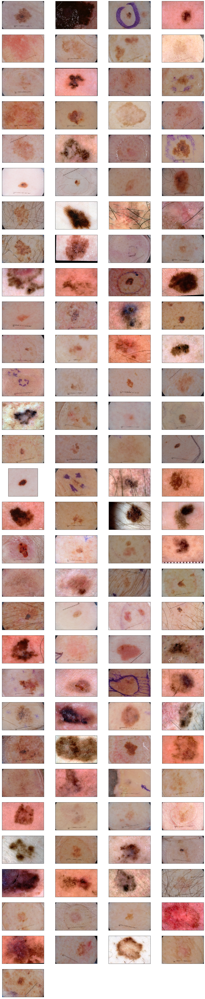

In [109]:
fig = plt.figure(figsize=(20, 100))
for n, i in enumerate(melanoma.index):
    ax = fig.add_subplot(30, 4, n + 1, xticks=[], yticks=[])
    visualize_img(test_files[i], ax)

In [66]:
from sklearn.metrics import confusion_matrix

In [139]:
confusion_matrix(targets, preds)

array([[  5, 100,  12],
       [ 14, 369,  10],
       [  0,  50,  40]], dtype=int64)